In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import os


In [2]:
abspath = os.getcwd()
abspath = abspath.split("abag-benchmark-set")[0] + "abag-benchmark-set"

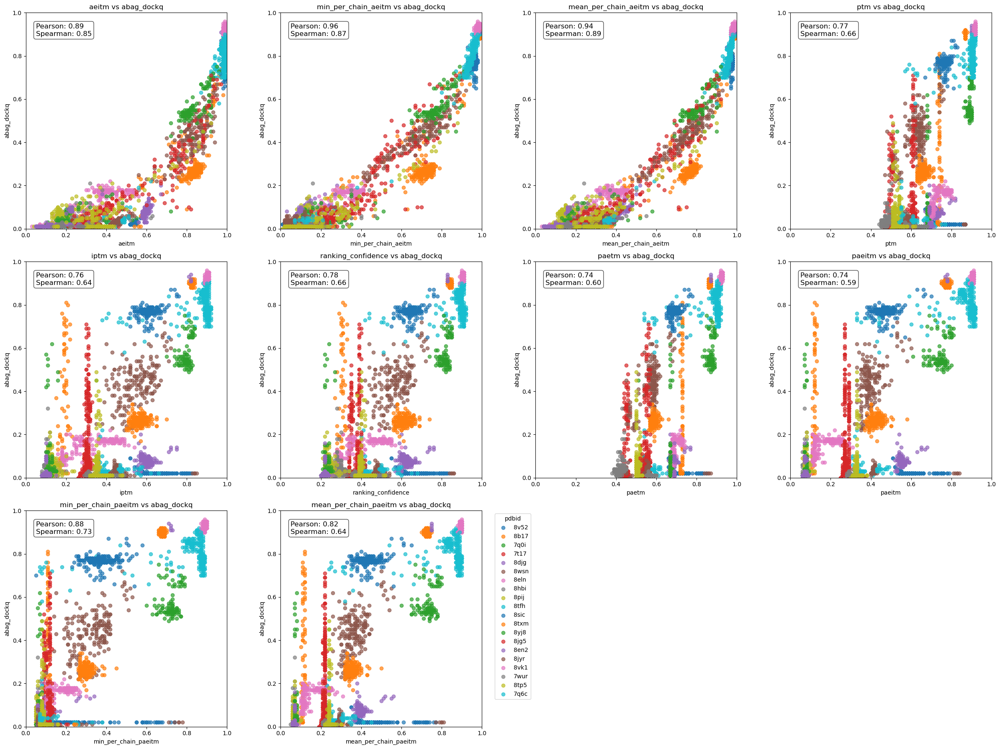

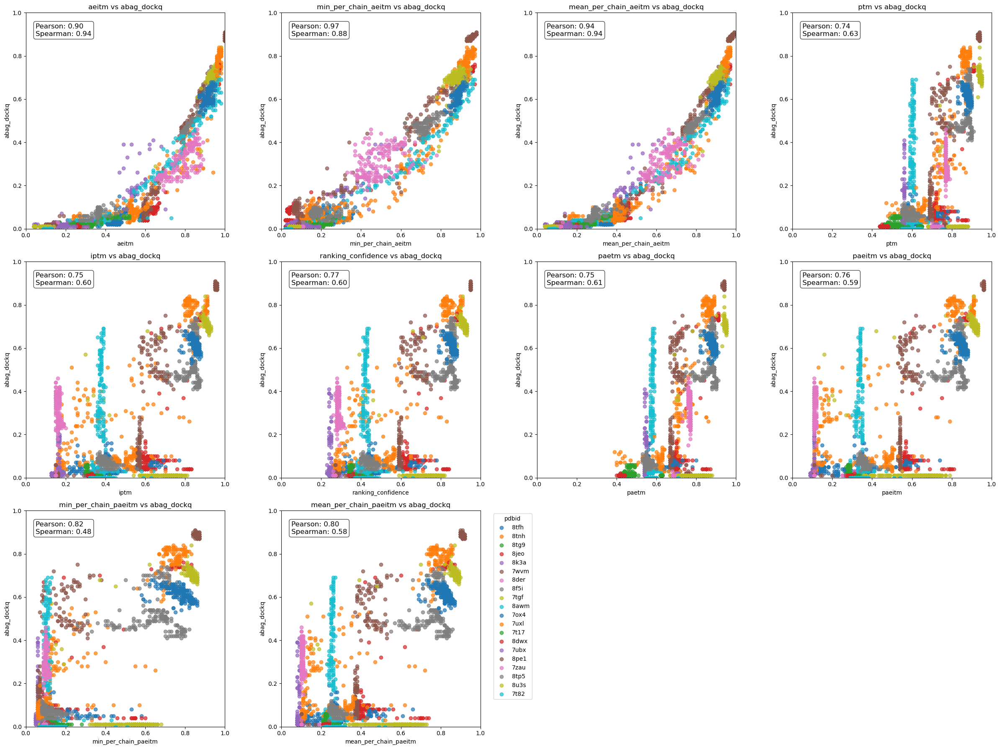

In [3]:
import pandas as pd
import math
import matplotlib.pyplot as plt
import os
import random
from scipy.stats import pearsonr, spearmanr
import seaborn as sns

presets = ['default', 'norecycles', 'subsampling-32-64', 'subsampling-32-64-noresamplemsa', 'subsampling-16-32', 'dropout', 'msamasking10', 'msacolumnmasking15', 'alphafold3']

score_paths = {preset: os.path.join(abspath, f"data/scores_ae/{preset}/scores_{preset}.csv") for preset in presets}

for preset in ["alphafold3", "default"]:
    # Load the CSV file
    df = pd.read_csv(score_paths[preset])  # Replace with your actual file path
    
    if 'pdbid' not in df.columns:
        raise ValueError("The dataframe does not contain a 'pdbid' column.")
    
    # Convert 'pdbid' to categorical for color mapping
    df['pdbid'] = df['pdbid'].astype(str)
    unique_pdbids = df['pdbid'].unique()
    
    # Randomly select 20 pdbids
    selected_pdbids = random.sample(list(unique_pdbids), min(20, len(unique_pdbids)))
    df = df[df['pdbid'].isin(selected_pdbids)]
    
    color_map = {pdbid: color for pdbid, color in zip(selected_pdbids, sns.color_palette("tab10", len(selected_pdbids)))}
    
    # List of columns to plot on the x-axis (extended)
    columns_to_plot = ['aeitm', 'min_per_chain_aeitm',
        'mean_per_chain_aeitm', 'ptm', 'iptm', 'ranking_confidence', 'paetm',
        'paeitm',
       'min_per_chain_paeitm', 'mean_per_chain_paeitm']
    
    # List of columns to plot on the y-axis (even if it has only one element)
    columns_to_compare = ['abag_dockq']
    
    # Maximum number of plots per row
    max_plots_per_row = 4
    
    # Outer loop to iterate over 'columns_to_compare' (y-axis)
    for compare_col in columns_to_compare:
        num_rows = math.ceil(len(columns_to_plot) / max_plots_per_row)
        fig, axes = plt.subplots(num_rows, min(len(columns_to_plot), max_plots_per_row),
                                 figsize=(6 * min(len(columns_to_plot), max_plots_per_row), 6 * num_rows))
        
        if num_rows == 1 and len(columns_to_plot) <= max_plots_per_row:
            axes = [axes] if isinstance(axes, plt.Axes) else axes
        else:
            axes = axes.ravel()
        
        for i, col in enumerate(columns_to_plot):
            for pdbid in selected_pdbids:
                subset = df[df['pdbid'] == pdbid]
                axes[i].scatter(subset[col], subset[compare_col], alpha=0.7, label=pdbid, color=color_map[pdbid])
            
            axes[i].set_title(f'{col} vs {compare_col}')
            axes[i].set_xlabel(col)
            axes[i].set_ylabel(compare_col)
            axes[i].set_xlim(0, 1)
            axes[i].set_ylim(0, 1)
            
            pearson_corr, _ = pearsonr(df[col], df[compare_col])
            spearman_corr, _ = spearmanr(df[col], df[compare_col])
            
            axes[i].text(0.05, 0.95, f'Pearson: {pearson_corr:.2f}\nSpearman: {spearman_corr:.2f}',
                         transform=axes[i].transAxes, fontsize=12, verticalalignment='top',
                         bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white', alpha=0.7))
            
        for j in range(i + 1, len(axes)):
            fig.delaxes(axes[j])
        
        plt.legend(title='pdbid', bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.tight_layout()
        plt.show()


/tmp/ipykernel_650252/3243478148.py:45: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  pearson_corr, _ = pearsonr(df_filtered[col], df_filtered[compare_col])
/tmp/ipykernel_650252/3243478148.py:46: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_corr, _ = spearmanr(df_filtered[col], df_filtered[compare_col])


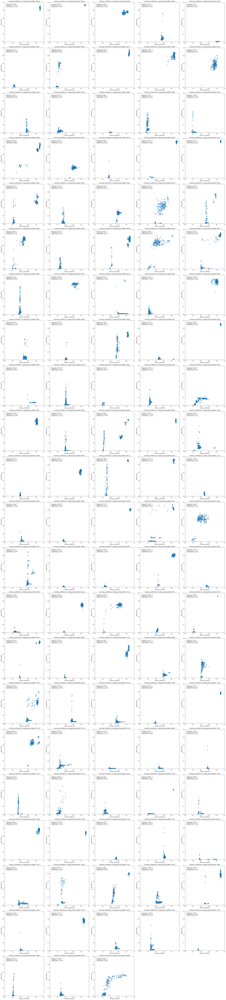

In [8]:
import pandas as pd
import math
import matplotlib.pyplot as plt
from scipy.stats import pearsonr, spearmanr
import os

presets = ['default', 'norecycles', 'subsampling-32-64', 'subsampling-32-64-noresamplemsa', 'subsampling-16-32', 'dropout', 'msamasking10', 'msacolumnmasking15', 'alphafold3']

score_paths = {preset: os.path.join(abspath, f"data/scores_ae/{preset}/scores_{preset}.csv") for preset in presets}

for preset in ["alphafold3"]:
    df = pd.read_csv(score_paths[preset])
    
    if 'pdbid' not in df.columns:
        raise ValueError("The dataset must contain a 'pdbid' column.")
    
    columns_to_plot = ['ranking_confidence']
    columns_to_compare = ['abag_dockq']
    max_plots_per_row = 5
    
    unique_pdbids = df['pdbid'].unique()
    num_rows = math.ceil(len(unique_pdbids) / max_plots_per_row)
    fig, axes = plt.subplots(num_rows, min(len(unique_pdbids), max_plots_per_row), 
                             figsize=(6 * min(len(unique_pdbids), max_plots_per_row), 6 * num_rows))
    
    if num_rows == 1 and len(unique_pdbids) <= max_plots_per_row:
        axes = [axes] if isinstance(axes, plt.Axes) else axes
    else:
        axes = axes.ravel()
    
    for i, pdbid in enumerate(unique_pdbids):
        df_filtered = df[df['pdbid'] == pdbid]
        col = columns_to_plot[0]
        compare_col = columns_to_compare[0]
        
        axes[i].scatter(df_filtered[col], df_filtered[compare_col], alpha=0.7)
        axes[i].set_title(f'{col} vs {compare_col} (pdbid: {pdbid})')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel(compare_col)
        
        axes[i].set_xlim(0, 1)
        axes[i].set_ylim(0, 1)
        
        if len(df_filtered[col]) > 1 and len(df_filtered[compare_col]) > 1:
            pearson_corr, _ = pearsonr(df_filtered[col], df_filtered[compare_col])
            spearman_corr, _ = spearmanr(df_filtered[col], df_filtered[compare_col])
        else:
            pearson_corr, spearman_corr = float('nan'), float('nan')
        
        axes[i].text(0.05, 0.95, f'Pearson: {pearson_corr:.2f}\nSpearman: {spearman_corr:.2f}', 
                     transform=axes[i].transAxes, fontsize=12, verticalalignment='top', 
                     bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white', alpha=0.7))
    
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])
    
    plt.tight_layout()
    #plt.savefig("pdbid_scatter_plots.png")
    plt.show()


/tmp/ipykernel_650252/582617858.py:45: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  pearson_corr, _ = pearsonr(df_filtered[col], df_filtered[compare_col])
/tmp/ipykernel_650252/582617858.py:46: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_corr, _ = spearmanr(df_filtered[col], df_filtered[compare_col])


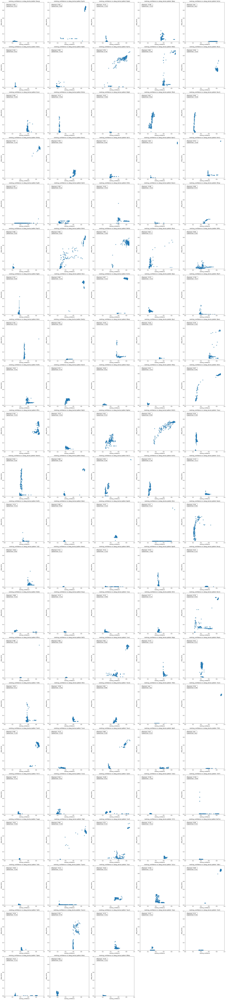

In [7]:
import pandas as pd
import math
import matplotlib.pyplot as plt
from scipy.stats import pearsonr, spearmanr
import os

presets = ['default', 'norecycles', 'subsampling-32-64', 'subsampling-32-64-noresamplemsa', 'subsampling-16-32', 'dropout', 'msamasking10', 'msacolumnmasking15', 'alphafold3']

score_paths = {preset: os.path.join(abspath, f"data/scores_ae/{preset}/scores_{preset}.csv") for preset in presets}

for preset in ["default"]:
    df = pd.read_csv(score_paths[preset])
    
    if 'pdbid' not in df.columns:
        raise ValueError("The dataset must contain a 'pdbid' column.")
    
    columns_to_plot = ['ranking_confidence']
    columns_to_compare = ['abag_dockq']
    max_plots_per_row = 5
    
    unique_pdbids = df['pdbid'].unique()
    num_rows = math.ceil(len(unique_pdbids) / max_plots_per_row)
    fig, axes = plt.subplots(num_rows, min(len(unique_pdbids), max_plots_per_row), 
                             figsize=(6 * min(len(unique_pdbids), max_plots_per_row), 6 * num_rows))
    
    if num_rows == 1 and len(unique_pdbids) <= max_plots_per_row:
        axes = [axes] if isinstance(axes, plt.Axes) else axes
    else:
        axes = axes.ravel()
    
    for i, pdbid in enumerate(unique_pdbids):
        df_filtered = df[df['pdbid'] == pdbid]
        col = columns_to_plot[0]
        compare_col = columns_to_compare[0]
        
        axes[i].scatter(df_filtered[col], df_filtered[compare_col], alpha=0.7)
        axes[i].set_title(f'{col} vs {compare_col} (pdbid: {pdbid})')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel(compare_col)
        
        axes[i].set_xlim(0, 1)
        axes[i].set_ylim(0, 1)
        
        if len(df_filtered[col]) > 1 and len(df_filtered[compare_col]) > 1:
            pearson_corr, _ = pearsonr(df_filtered[col], df_filtered[compare_col])
            spearman_corr, _ = spearmanr(df_filtered[col], df_filtered[compare_col])
        else:
            pearson_corr, spearman_corr = float('nan'), float('nan')
        
        axes[i].text(0.05, 0.95, f'Pearson: {pearson_corr:.2f}\nSpearman: {spearman_corr:.2f}', 
                     transform=axes[i].transAxes, fontsize=12, verticalalignment='top', 
                     bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white', alpha=0.7))
    
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])
    
    plt.tight_layout()
    #plt.savefig("pdbid_scatter_plots.png")
    plt.show()


In [5]:
import pandas as pd
import math
import matplotlib.pyplot as plt
from scipy.stats import pearsonr, spearmanr
import os

presets = ['default', 'alphafold3']  # Including only 'default' and 'alphafold3' for comparison
score_paths = {preset: os.path.join(abspath, f"data/scores_ae/{preset}/scores_{preset}.csv") for preset in presets}

data = {}
for preset in presets:
    df = pd.read_csv(score_paths[preset])
    if 'pdbid' not in df.columns:
        raise ValueError("The dataset must contain a 'pdbid' column.")
    data[preset] = df

columns_to_plot = ['ranking_confidence']
columns_to_compare = ['abag_dockq']

unique_pdbids = data['alphafold3']['pdbid'].unique()
num_pdbids = len(unique_pdbids)

fig, axes = plt.subplots(num_pdbids, 2, figsize=(12, 6 * num_pdbids), squeeze=False)

for i, pdbid in enumerate(unique_pdbids):
    for j, preset in enumerate(presets):
        df_filtered = data[preset][data[preset]['pdbid'] == pdbid]
        col = columns_to_plot[0]
        compare_col = columns_to_compare[0]
        
        axes[i, j].scatter(df_filtered[col], df_filtered[compare_col], alpha=0.7)
        axes[i, j].set_title(f'{preset}: {col} vs {compare_col}\n(pdbid: {pdbid})')
        axes[i, j].set_xlabel(col)
        axes[i, j].set_ylabel(compare_col)
        
        axes[i, j].set_xlim(0, 1)
        axes[i, j].set_ylim(0, 1)
        
        if len(df_filtered[col]) > 1 and len(df_filtered[compare_col]) > 1:
            pearson_corr, _ = pearsonr(df_filtered[col], df_filtered[compare_col])
            spearman_corr, _ = spearmanr(df_filtered[col], df_filtered[compare_col])
        else:
            pearson_corr, spearman_corr = float('nan'), float('nan')
        
        axes[i, j].text(0.05, 0.95, f'Pearson: {pearson_corr:.2f}\nSpearman: {spearman_corr:.2f}',
                         transform=axes[i, j].transAxes, fontsize=12, verticalalignment='top',
                         bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white', alpha=0.7))

plt.tight_layout()
plt.savefig("pdbid_scatter_plots_comparison.png")
plt.show()


/tmp/ipykernel_650252/1452119384.py:40: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  pearson_corr, _ = pearsonr(df_filtered[col], df_filtered[compare_col])
/tmp/ipykernel_650252/1452119384.py:41: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_corr, _ = spearmanr(df_filtered[col], df_filtered[compare_col])


In [6]:
import pandas as pd
import math
import matplotlib.pyplot as plt
from scipy.stats import pearsonr, spearmanr
import os

presets = ['default', 'norecycles', 'subsampling-32-64', 'subsampling-32-64-noresamplemsa', 'subsampling-16-32', 'dropout', 'msamasking10', 'msacolumnmasking15', 'alphafold3']

score_paths = {preset: os.path.join(abspath, f"data/scores_ae/{preset}/scores_{preset}.csv") for preset in presets}

for preset in ["alphafold3"]:
    df = pd.read_csv(score_paths[preset])
    
    if 'pdbid' not in df.columns:
        raise ValueError("The dataset must contain a 'pdbid' column.")
    
    columns_to_plot = ['ranking_confidence','ae_ranking_confidence']  # This can contain multiple elements
    columns_to_compare = ['abag_dockq']
    
    unique_pdbids = df['pdbid'].unique()
    num_rows = len(unique_pdbids)
    num_cols = len(columns_to_plot)
    
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(6 * num_cols, 6 * num_rows), squeeze=False)
    
    for i, pdbid in enumerate(unique_pdbids):
        df_filtered = df[df['pdbid'] == pdbid]
        compare_col = columns_to_compare[0]
        
        for j, col in enumerate(columns_to_plot):
            axes[i, j].scatter(df_filtered[col], df_filtered[compare_col], alpha=0.7)
            axes[i, j].set_title(f'{col} vs {compare_col} (pdbid: {pdbid})')
            axes[i, j].set_xlabel(col)
            axes[i, j].set_ylabel(compare_col)
            
            axes[i, j].set_xlim(0, 1)
            axes[i, j].set_ylim(0, 1)
            
            if len(df_filtered[col]) > 1 and len(df_filtered[compare_col]) > 1:
                pearson_corr, _ = pearsonr(df_filtered[col], df_filtered[compare_col])
                spearman_corr, _ = spearmanr(df_filtered[col], df_filtered[compare_col])
            else:
                pearson_corr, spearman_corr = float('nan'), float('nan')
            
            axes[i, j].text(0.05, 0.95, f'Pearson: {pearson_corr:.2f}\nSpearman: {spearman_corr:.2f}', 
                             transform=axes[i, j].transAxes, fontsize=12, verticalalignment='top', 
                             bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white', alpha=0.7))
    
    plt.tight_layout()
    plt.savefig("pdbid_scatter_plots.png")
    plt.show()


/tmp/ipykernel_650252/965373343.py:40: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  pearson_corr, _ = pearsonr(df_filtered[col], df_filtered[compare_col])
/tmp/ipykernel_650252/965373343.py:41: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_corr, _ = spearmanr(df_filtered[col], df_filtered[compare_col])
